# Importing Necessary Packages


In [3]:

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
# plotly
import plotly as py
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.figure_factory as ff # import figure factory

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory

# close warning
import warnings
warnings.filterwarnings("ignore")

Reading Datset

In [4]:
df=pd.read_csv('./weldDataset.csv')

In [5]:
df.head()

,Employee Code,Machine,Production,Order Operation No,Date,Time,Current,Humidity,Temperature,Flow,...,Unnamed: 78,Unnamed: 79,Unnamed: 80,Unnamed: 81,Unnamed: 82,Unnamed: 83,Unnamed: 84,Unnamed: 85,Unnamed: 86,Unnamed: 87
0,382617,TWLD23,E15002965,240,10-09-2022,7:32:28:527,1.13,74,23,0.01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,382617,TWLD23,E15002965,240,10-09-2022,7:32:29:40,1.82,74,23,0.00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,382617,TWLD23,E15002965,240,10-09-2022,7:32:29:677,2.91,74,23,0.00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,382617,TWLD23,E15002965,240,10-09-2022,7:32:30:166,0.04,74,23,0.00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,382617,TWLD23,E15002965,240,10-09-2022,7:32:30:696,2.51,74,23,0.00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
#Removing The unnecessary Columns from it
data=df.iloc[:,0:13]
data

,Employee Code,Machine,Production,Order Operation No,Date,Time,Current,Humidity,Temperature,Flow,Job Temp,Voltage,Defect
0,382617,TWLD23,E15002965,240,10-09-2022,7:32:28:527,1.13,74,23,0.01,29.3,15.2,No Defect
1,382617,TWLD23,E15002965,240,10-09-2022,7:32:29:40,1.82,74,23,0.00,29.3,0.0,Tungsten Inclusion
2,382617,TWLD23,E15002965,240,10-09-2022,7:32:29:677,2.91,74,23,0.00,29.3,0.0,No Defect
3,382617,TWLD23,E15002965,240,10-09-2022,7:32:30:166,0.04,74,23,0.00,29.3,0.0,No Defect
4,382617,TWLD23,E15002965,240,10-09-2022,7:32:30:696,2.51,74,23,0.00,27.8,0.0,No Defect
...,...,...,...,...,...,...,...,...,...,...,...,...,...
827529,391342,TWLD23,15003062,240,29-08-2022,23:2:13:452,0.33,58,24,0.00,34.0,0.0,No Defect
827530,391342,TWLD23,15003062,240,29-08-2022,23:2:14:46,0.34,58,24,0.00,34.0,0.0,No Defect
827531,391342,TWLD23,15003062,240,29-08-2022,23:2:14:552,-0.86,58,24,0.06,34.0,0.0,No Defect
827532,391342,TWLD23,15003062,240,29-08-2022,23:2:15:143,0.32,58,24,0.00,34.6,0.0,No Defect


In [7]:
# Display the content of data
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 827534 entries, 0 to 827533
Data columns (total 13 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Employee Code       827534 non-null  int64  
 1   Machine             827534 non-null  object 
 2   Production          827534 non-null  object 
 3   Order Operation No  827534 non-null  object 
 4   Date                827534 non-null  object 
 5   Time                827534 non-null  object 
 6   Current             827531 non-null  float64
 7   Humidity            827534 non-null  int64  
 8   Temperature         827534 non-null  int64  
 9   Flow                827534 non-null  float64
 10  Job Temp            827534 non-null  float64
 11  Voltage             827534 non-null  float64
 12  Defect              827534 non-null  object 
dtypes: float64(4), int64(3), object(6)
memory usage: 82.1+ MB


In [8]:
data['Order Operation No'].value_counts()

240     484464
180     128647
1        69444
180-     53238
40       47259
130      16711
30       15473
240       7006
1         2290
-240      1315
130        947
-          740
Name: Order Operation No, dtype: int64

In [9]:
# shape gives number of rows and columns in a tuple
data.shape

(827534, 13)

In [10]:
# A Quick Summary Of the DataSet
data.describe()

,Employee Code,Current,Humidity,Temperature,Flow,Job Temp,Voltage
count,827534.000000,827531.000000,827534.000000,827534.000000,827534.000000,827534.000000,827534.000000
mean,318584.042989,8.673910,74.956373,23.884997,1.763230,136.406572,2.846528
std,139094.397127,13.219352,10.374707,3.491204,1.741196,558.122529,4.616725
min,0.000000,-2.000000,0.000000,-13.000000,0.000000,0.000000,-2.578000
25%,382617.000000,0.260000,72.000000,24.000000,0.000000,29.800000,0.000000
50%,391342.000000,2.250000,76.000000,24.000000,1.600000,31.300000,0.000000
75%,394269.000000,13.680000,79.000000,25.000000,3.140000,35.600000,8.660000
max,394965.000000,163.000000,2444.000000,828.000000,14.470000,3276.700000,24.499000


In [11]:
# Checking For the Null Values In Dataset
data.isnull().sum()

Employee Code         0
Machine               0
Production            0
Order Operation No    0
Date                  0
Time                  0
Current               3
Humidity              0
Temperature           0
Flow                  0
Job Temp              0
Voltage               0
Defect                0
dtype: int64

In [12]:
# Droping rows containing the null values
data.dropna(inplace=True)

In [13]:
#checking after droping the null values
data.isnull().sum()

Employee Code         0
Machine               0
Production            0
Order Operation No    0
Date                  0
Time                  0
Current               0
Humidity              0
Temperature           0
Flow                  0
Job Temp              0
Voltage               0
Defect                0
dtype: int64

In [14]:
# Display positive and negative correlation between columns
data.corr()

,Employee Code,Current,Humidity,Temperature,Flow,Job Temp,Voltage
Employee Code,1.000000,0.031056,-0.091889,0.013019,0.020477,-0.243806,0.127010
Current,0.031056,1.000000,-0.011689,-0.009614,0.089914,0.017546,0.705117
Humidity,-0.091889,-0.011689,1.000000,0.707087,-0.029554,-0.074149,-0.074754
Temperature,0.013019,-0.009614,0.707087,1.000000,-0.005524,-0.035515,-0.032864
Flow,0.020477,0.089914,-0.029554,-0.005524,1.000000,0.138386,0.137253
Job Temp,-0.243806,0.017546,-0.074149,-0.035515,0.138386,1.000000,0.054911
Voltage,0.127010,0.705117,-0.074754,-0.032864,0.137253,0.054911,1.000000


In [15]:
#sorts all correlations with ascending sort.
data.corr().unstack().sort_values().drop_duplicates()

Employee Code  Job Temp        -0.243806
               Humidity        -0.091889
Voltage        Humidity        -0.074754
Job Temp       Humidity        -0.074149
Temperature    Job Temp        -0.035515
               Voltage         -0.032864
Humidity       Flow            -0.029554
               Current         -0.011689
Current        Temperature     -0.009614
Temperature    Flow            -0.005524
Employee Code  Temperature      0.013019
Current        Job Temp         0.017546
Employee Code  Flow             0.020477
Current        Employee Code    0.031056
Job Temp       Voltage          0.054911
Current        Flow             0.089914
Voltage        Employee Code    0.127010
Flow           Voltage          0.137253
               Job Temp         0.138386
Current        Voltage          0.705117
Humidity       Temperature      0.707087
Employee Code  Employee Code    1.000000
dtype: float64

In [16]:
# Checking the counts of output class i.e Defect 
data['Defect'].value_counts()

No Defect               819549
Tungsten Inclusion        4600
Porosity                  1138
No Defect77                220
No Defect78                211
No Defect76                158
No Defect79                144
No Defect75                140
No Defect80                121
No Defect73                108
No Defect0                 106
No Defect72                104
No Defect81                102
No Defect71                 93
No Defect74                 81
No Defect83                 77
No Defect70                 67
No Defect84                 62
No Defect67                 59
No Defect65                 51
No Defect82                 48
No Defect68                 46
No Defect69                 45
No Defect66                 40
No Defect64                 31
No Defect63                 24
No Defect85                 21
No Defect61                 15
No Defect58                  9
No Defect86                  7
No Defect62                  7
No Defect87                  7
No Defec

In [17]:
# Converting all types of Defect into Single Class Attribute

data['Defect'] = data['Defect'].replace('^No.........', 'No Defect', regex=True)


In [18]:
data['Defect'] = data['Defect'].replace('^Tungsten Inclusion..', 'Tungsten Inclusion', regex=True)

In [19]:
data['Defect'] = data['Defect'].replace('^Porosity..', 'Tungsten Inclusion', regex=True)

In [20]:
data['Defect'] = data['Defect'].replace('No Defect0', 'No Defect', regex=True)

In [21]:
#Saving the clean Data into csv file
data.to_csv("Cleaned_Data.csv")

In [22]:
#conversion of 52 different classes into three unique classes
data['Defect'].value_counts()

No Defect             821778
Tungsten Inclusion      4615
Porosity                1138
Name: Defect, dtype: int64

In [23]:
# For Model Training Converting the categorical variables into ordinal by using Label Encoder
from sklearn.preprocessing import LabelEncoder
encode_ferti = LabelEncoder()
data['Defect'] = encode_ferti.fit_transform(data['Defect'])

#creating the DataFrame
Fertilizer = pd.DataFrame(zip(encode_ferti.classes_,encode_ferti.transform(encode_ferti.classes_)),columns=['Original','Encoded'])
Fertilizer = Fertilizer.set_index('Original')
Fertilizer

,Encoded
Original,
No Defect,0
Porosity,1
Tungsten Inclusion,2


In [22]:
# Implemented Some Function to find Some relationship between Output and input dependents

def plot_conti(x):
    fig, axes = plt.subplots(nrows=1,ncols=3,figsize=(15,5),tight_layout=True)
    axes[0].set_title('Histogram')
    sns.histplot(x,ax=axes[0])
    axes[1].set_title('Checking Outliers')
    sns.boxplot(x,ax=axes[1])
    axes[2].set_title('Relation with output variable')
    sns.boxplot(y = x,x = data['Defect'])

def plot_cato(x):
    fig, axes = plt.subplots(nrows=1,ncols=2,figsize=(15,5),tight_layout=True)
    axes[0].set_title('Count Plot')
    sns.countplot(x,ax=axes[0])
    axes[1].set_title('Relation with output variable')
    sns.countplot(x = x,hue = df['Defect'], ax=axes[1])    

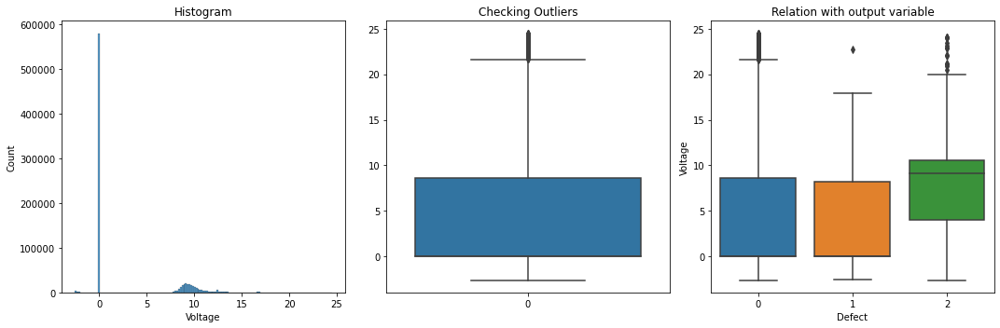

In [23]:
# volatage vs Defect relationship
plot_conti(data['Voltage'])

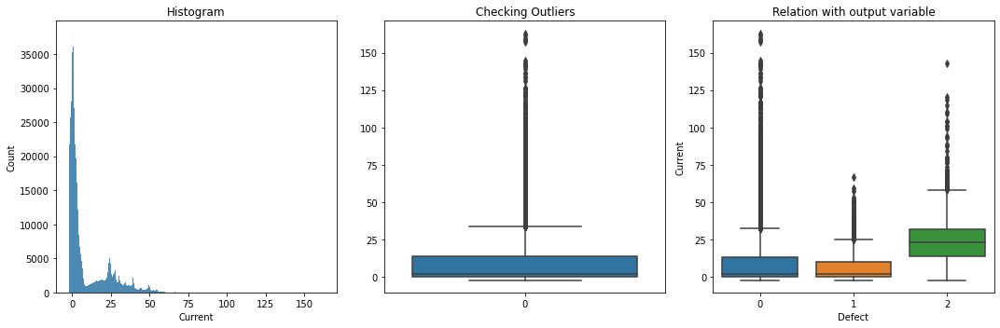

In [24]:
# Current vs Defect relationship
plot_conti(data['Current'])

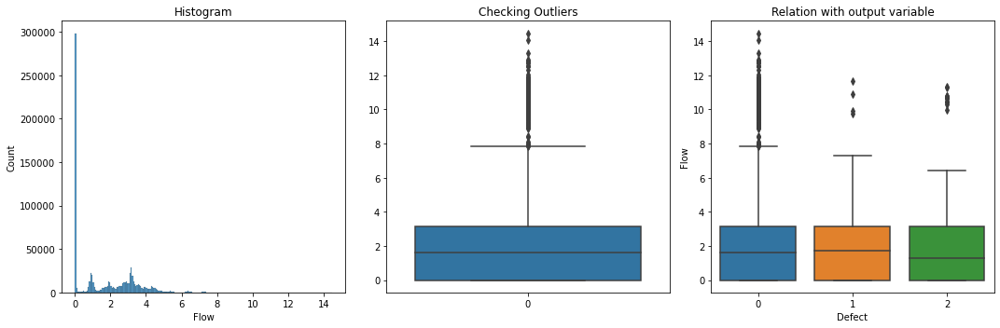

In [25]:
# Flow vs Defect relationship
plot_conti(data['Flow'])

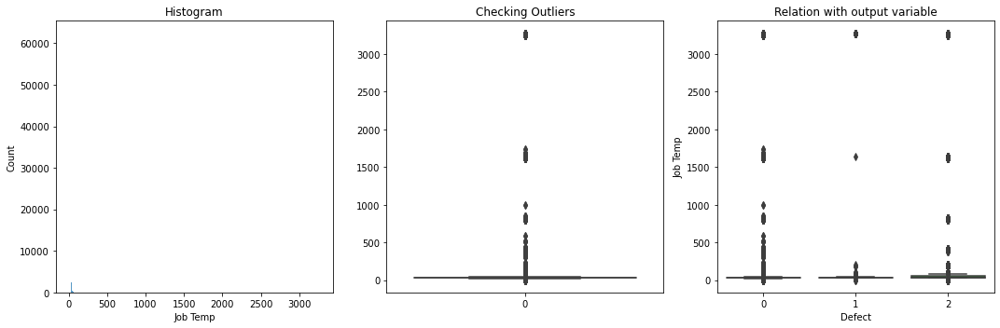

In [26]:
# volatage vs Defect relationship
plot_conti(data['Job Temp'])

In [26]:
# count of output variables based on their frequency
import plotly.graph_objects as go


fig = go.Figure(data=[go.Pie(labels=data['Defect'],pull=[0, 0.5, 0.3])])
fig.show()

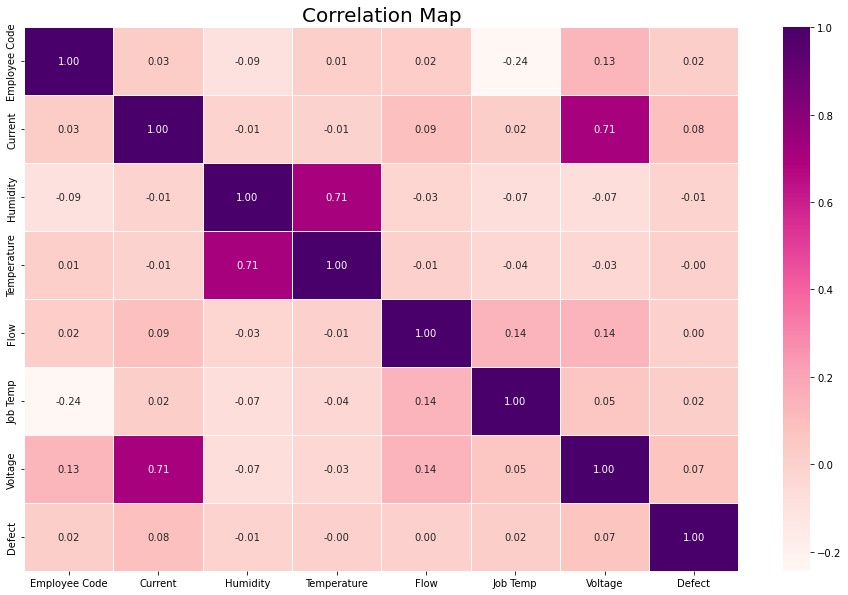

In [27]:
#correlation map
f, ax = plt.subplots(figsize=(16,10))
sns.heatmap(data.corr(), annot=True, linewidth=".5", cmap="RdPu", fmt=".2f", ax = ax)
plt.title("Correlation Map",fontsize=20)
plt.show()

In [24]:
#Selecting The independent and Depentend Variables 
y = data["Defect"]
x_data = data.drop(["Defect","Employee Code",'Time','Date',"Order Operation No","Machine","Production"], axis=1)

### Spliting up Data Into Train and Test data into 70% train and 30% test dataset

In [25]:
# Spliting The Data into Train and Test set

from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x_data, y, test_size=0.3,random_state=1)

print("x_train: ",x_train.shape)
print("x_test: ",x_test.shape)
print("y_train: ",y_train.shape)
print("y_test: ",y_test.shape)

x_train:  (579271, 6)
x_test:  (248260, 6)
y_train:  (579271,)
y_test:  (248260,)


# Model training

## Logisitic Regression

In [30]:
from sklearn.linear_model import LogisticRegression

lr_model = LogisticRegression()
lr_model.fit(x_train,y_train)

#Print Train Accuracy
lr_train_accuracy = lr_model.score(x_train,y_train)
print("lr_train_accuracy = ",lr_model.score(x_train,y_train))
#Print Test Accuracy
lr_test_accuracy = lr_model.score(x_test,y_test)
print("lr_test_accuracy = ",lr_model.score(x_test,y_test))

lr_train_accuracy =  0.9918155750935227
lr_test_accuracy =  0.9917707242407153


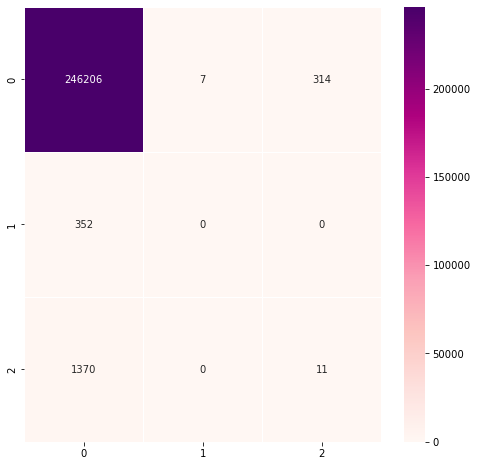

In [31]:
y_pred = lr_model.predict(x_test)
y_true = y_test

from sklearn.metrics import confusion_matrix

cm_lr = confusion_matrix(y_true,y_pred)

f, ax = plt.subplots(figsize=(8,8))
sns.heatmap(cm_lr, annot=True, linewidth=0.5, fmt=".0f",  cmap='RdPu', ax = ax)
plt.xlabel = ('y_pred')
plt.ylabel = ('y_true')
plt.show()

### Model Performance using Precision,recall,F1 Score,weighted f1 score

In [34]:
from sklearn.metrics import classification_report,roc_auc_score
print(classification_report(y_true,y_pred))


              precision    recall  f1-score   support

           0       0.99      1.00      1.00    246527
           1       0.00      0.00      0.00       352
           2       0.03      0.01      0.01      1381

    accuracy                           0.99    248260
   macro avg       0.34      0.34      0.34    248260
weighted avg       0.99      0.99      0.99    248260



## Plotting AUCROC Curve for given Model

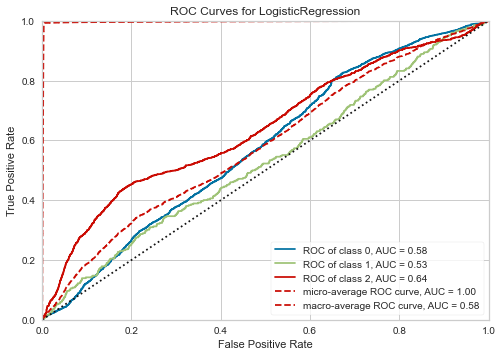

<AxesSubplot:title={'center':'ROC Curves for LogisticRegression'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [38]:
from yellowbrick.classifier import ROCAUC
model=LogisticRegression()
visualizer=ROCAUC(model)
visualizer.fit(x_train,y_train)
visualizer.score(x_test,y_test)
visualizer.show()

## Navie Bayes

In [39]:
from sklearn.naive_bayes import GaussianNB

nb_model = GaussianNB()
nb_model.fit(x_train,y_train)

#Print Train Accuracy
nb_train_accuracy = nb_model.score(x_train,y_train)
print("nb_train_accuracy = ",nb_model.score(x_train,y_train))
#Print Test Accuracy
nb_test_accuracy = nb_model.score(x_test,y_test)
print("nb_test_accuracy = ",nb_model.score(x_test,y_test))

nb_train_accuracy =  0.9710739878226253
nb_test_accuracy =  0.9701039233062112


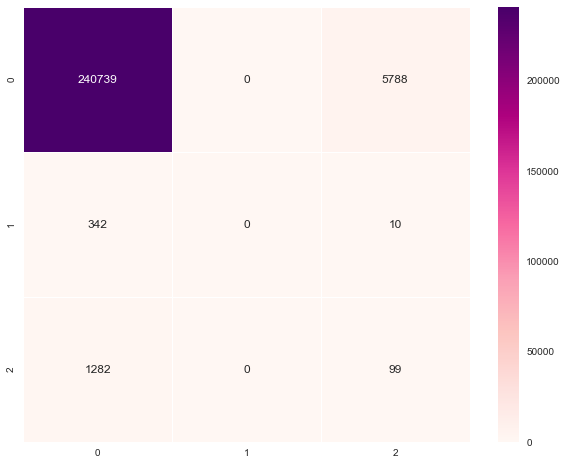

In [41]:
y_pred = nb_model.predict(x_test)
y_true = y_test

from sklearn.metrics import confusion_matrix

cm_lr = confusion_matrix(y_true,y_pred)

f, ax = plt.subplots(figsize=(10,8))
sns.heatmap(cm_lr, annot=True, linewidth=0.8, fmt=".0f",  cmap='RdPu', ax = ax)
plt.xlabel = ('y_pred')
plt.ylabel = ('y_true')
plt.show()

In [42]:
data = [go.Bar(
            x=["nb_train_accuracy","nb_test_accuracy"],
            y=[nb_train_accuracy,nb_test_accuracy],
            marker=dict(color='rgb(158,202,225)',
            line=dict(color='rgba(254, 69, 62, 1)',
            width=1.5),
        ),
    opacity=0.6
    )]

iplot(data, filename='text-hover-bar')

In [43]:
from sklearn.metrics import classification_report,roc_auc_score
print(classification_report(y_true,y_pred))


              precision    recall  f1-score   support

           0       0.99      0.98      0.98    246527
           1       0.00      0.00      0.00       352
           2       0.02      0.07      0.03      1381

    accuracy                           0.97    248260
   macro avg       0.34      0.35      0.34    248260
weighted avg       0.99      0.97      0.98    248260



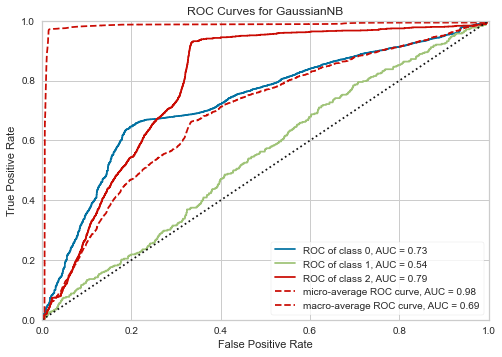

<AxesSubplot:title={'center':'ROC Curves for GaussianNB'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [44]:
from yellowbrick.classifier import ROCAUC
model=GaussianNB()
visualizer=ROCAUC(model)
visualizer.fit(x_train,y_train)
visualizer.score(x_test,y_test)
visualizer.show()

# K-Nearest Neighbors (KNN) Classification

In [45]:
from sklearn.neighbors import KNeighborsClassifier

knn_model = KNeighborsClassifier(n_neighbors=3)
knn_model.fit(x_train,y_train)

#Print Train Accuracy
knn_train_accuracy = knn_model.score(x_train,y_train)
print("knn_train_accuracy = ",knn_model.score(x_train,y_train))
#Print Test Accuracy
knn_test_accuracy = knn_model.score(x_test,y_test)
print("knn_test_accuracy = ",knn_model.score(x_test,y_test))

knn_train_accuracy =  0.9941650799021529
knn_test_accuracy =  0.9929469104970595


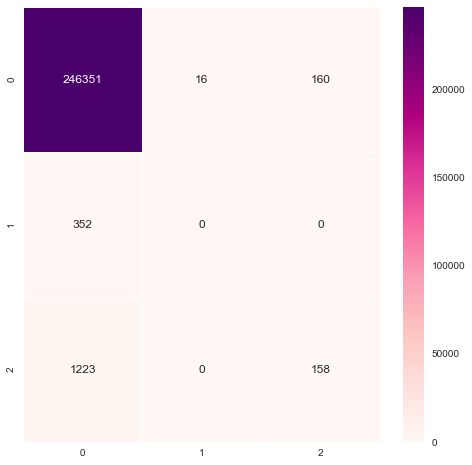

In [50]:
y_pred = knn_model.predict(x_test)
y_true = y_test

from sklearn.metrics import confusion_matrix

cm_knn = confusion_matrix(y_true,y_pred)

f, ax = plt.subplots(figsize=(8,8))
sns.heatmap(cm_knn, annot=True, linewidth=0.5, fmt=".0f",  cmap='RdPu', ax = ax)
plt.xlabel = ("y_pred")
plt.ylabel = ("y_true")
plt.show()

Model Complexity

Now the question is why we choose K = 3 or what value we need to choose K. The answer is in model complexity


Model complexity:

K has general name. It is called a hyperparameter. For now just know K is hyperparameter and we need to choose it that gives best performace.

Literature says if k is small, model is complex model can lead to overfit. It means that model memorizes the train sets and cannot predict test set with good accuracy.

If k is big, model that is less complex model can lead to underfit.

In [39]:
# Model complexity
neighboors = np.arange(1,15)
train_accuracy = []
test_accuracy = []
# Loop over different values of k
for i, k in enumerate(neighboors):
    # k from 1 to 30(exclude)
    knn = KNeighborsClassifier(n_neighbors=k)
    # fit with knn
    knn.fit(x_train, y_train)
    train_accuracy.append(knn.score(x_train, y_train))           # train accuracy
    test_accuracy.append(knn.score(x_test, y_test))              # test accuracy

# import graph objects as "go"
import plotly.graph_objs as go

# Creating trace1
trace1 = go.Scatter(
                    x = neighboors,
                    y = train_accuracy,
                    mode = "lines",
                    name = "train_accuracy",
                    marker = dict(color = 'rgba(160, 112, 2, 0.8)'),
                    text= "train_accuracy")
# Creating trace2
trace2 = go.Scatter(
                    x = neighboors,
                    y = test_accuracy,
                    mode = "lines+markers",
                    name = "test_accuracy",
                    marker = dict(color = 'rgba(80, 26, 80, 0.8)'),
                    text= "test_accuracy")
data = [trace1, trace2]
layout = dict(title = 'K Value vs Accuracy',
              xaxis= dict(title= 'Number of Neighboors',ticklen= 10,zeroline= True)
             )
fig = dict(data = data, layout = layout)
iplot(fig)

knn_train_accuracy = np.max(train_accuracy)
knn_test_accuracy = np.max(test_accuracy)
print("Best accuracy is {} with K = {}".format(np.max(test_accuracy), 1+test_accuracy.index(np.max(test_accuracy))))

Best accuracy is 0.9932731813421413 with K = 9


In [51]:
from sklearn.metrics import classification_report,roc_auc_score
print(classification_report(y_true,y_pred))


              precision    recall  f1-score   support

           0       0.99      1.00      1.00    246527
           1       0.00      0.00      0.00       352
           2       0.50      0.11      0.19      1381

    accuracy                           0.99    248260
   macro avg       0.50      0.37      0.39    248260
weighted avg       0.99      0.99      0.99    248260



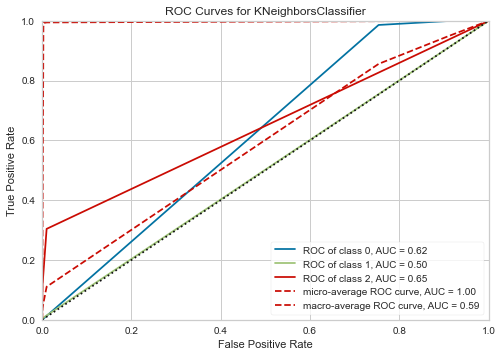

<AxesSubplot:title={'center':'ROC Curves for KNeighborsClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [52]:
from yellowbrick.classifier import ROCAUC
model=KNeighborsClassifier(3)
visualizer=ROCAUC(model)
visualizer.fit(x_train,y_train)
visualizer.score(x_test,y_test)
visualizer.show()

# Decision Tree Classification

In [53]:
from sklearn.tree import DecisionTreeClassifier
#if you remove random_state=1, you can see how accuracy is changing
#Accuracy changing depends on splits
dt_model = DecisionTreeClassifier(random_state=2)
dt_model.fit(x_train,y_train)

#Print Train Accuracy
dt_train_accuracy = dt_model.score(x_train,y_train)
print("dt_train_accuracy = ",dt_model.score(x_train,y_train))
#Print Test Accuracy
dt_test_accuracy = dt_model.score(x_test,y_test)
print("dt_test_accuracy = ",dt_model.score(x_test,y_test))

dt_train_accuracy =  0.9998860636903971
dt_test_accuracy =  0.9877426891162491


In [54]:
data = [go.Bar(
            x=["dt_train_accuracy","dt_test_accuracy"],
            y=[dt_train_accuracy,dt_test_accuracy],
            marker=dict(color='rgb(158,202,225)',
            line=dict(color='rgba(254, 69, 62, 1)',
            width=1.5),
        ),
    opacity=0.6
    )]

iplot(data, filename='text-hover-bar')

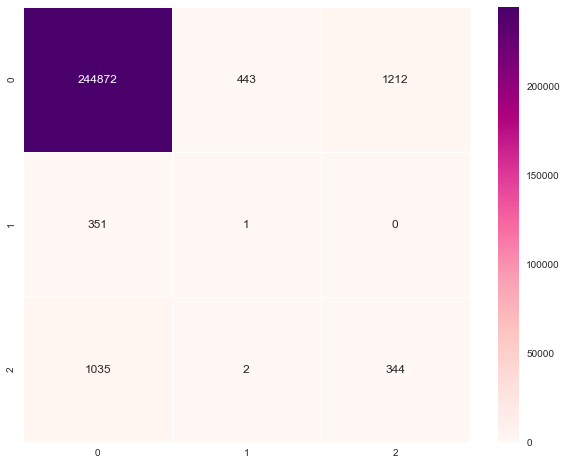

In [55]:
y_pred = dt_model.predict(x_test)
y_true = y_test

from sklearn.metrics import confusion_matrix

cm_dt = confusion_matrix(y_true,y_pred)

f, ax = plt.subplots(figsize=(10,8))
sns.heatmap(cm_dt, annot=True, linewidth=0.5, fmt=".0f",  cmap='RdPu', ax = ax)
plt.xlabel = ("y_pred")
plt.ylabel = ("y_true")
plt.show()

In [56]:
from sklearn.metrics import classification_report,roc_auc_score
print(classification_report(y_true,y_pred))


              precision    recall  f1-score   support

           0       0.99      0.99      0.99    246527
           1       0.00      0.00      0.00       352
           2       0.22      0.25      0.23      1381

    accuracy                           0.99    248260
   macro avg       0.41      0.42      0.41    248260
weighted avg       0.99      0.99      0.99    248260



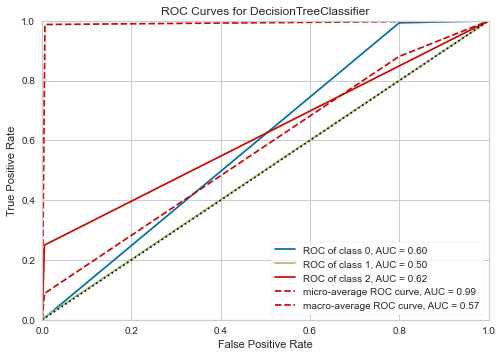

<AxesSubplot:title={'center':'ROC Curves for DecisionTreeClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [57]:
from yellowbrick.classifier import ROCAUC
model=DecisionTreeClassifier()
visualizer=ROCAUC(model)
visualizer.fit(x_train,y_train)
visualizer.score(x_test,y_test)
visualizer.show()

# Random Forest Classification

In [58]:
from sklearn.ensemble import RandomForestClassifier

#n_estimators = 100 => Indicates how many trees we have
rf_model = RandomForestClassifier(n_estimators=100, random_state=1)
rf_model.fit(x_train,y_train)

#Print Train Accuracy
rf_train_accuracy = rf_model.score(x_train,y_train)
print("rf_train_accuracy = ",rf_model.score(x_train,y_train))
#Print Test Accuracy
rf_test_accuracy = rf_model.score(x_test,y_test)
print("rf_test_accuracy = ",rf_model.score(x_test,y_test))

rf_train_accuracy =  0.9998739795363483
rf_test_accuracy =  0.9939136389269314


In [59]:
data = [go.Bar(
            x=["rf_train_accuracy","rf_test_accuracy"],
            y=[rf_train_accuracy,rf_test_accuracy],
            marker=dict(color='rgb(158,202,225)',
            line=dict(color='rgba(254, 69, 62, 1)',
            width=2),
        ),
    opacity=0.6
    )]

iplot(data, filename='text-hover-bar')

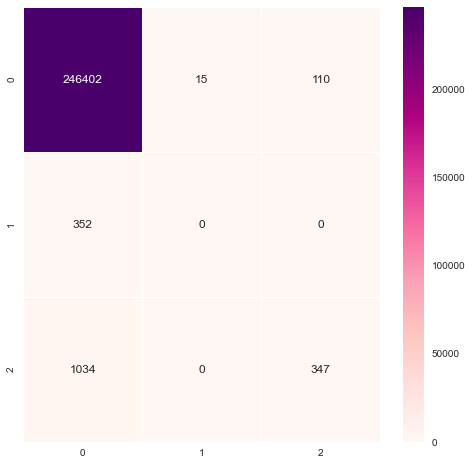

In [60]:
y_pred = rf_model.predict(x_test)
y_true = y_test

from sklearn.metrics import confusion_matrix

cm_rf = confusion_matrix(y_true,y_pred)

f, ax = plt.subplots(figsize=(8,8))
sns.heatmap(cm_rf, annot=True, linewidth=0.5, fmt=".0f",  cmap='RdPu', ax = ax)
plt.xlabel = ("y_pred")
plt.ylabel = ("y_true")
plt.show()

In [61]:
from sklearn.metrics import classification_report,roc_auc_score
print(classification_report(y_true,y_pred))


              precision    recall  f1-score   support

           0       0.99      1.00      1.00    246527
           1       0.00      0.00      0.00       352
           2       0.76      0.25      0.38      1381

    accuracy                           0.99    248260
   macro avg       0.58      0.42      0.46    248260
weighted avg       0.99      0.99      0.99    248260



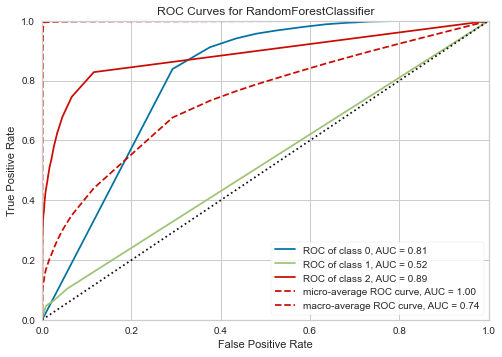

<AxesSubplot:title={'center':'ROC Curves for RandomForestClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [62]:
from yellowbrick.classifier import ROCAUC
model=RandomForestClassifier(n_estimators=100, random_state=1)
visualizer=ROCAUC(model)
visualizer.fit(x_train,y_train)
visualizer.score(x_test,y_test)
visualizer.show()

## Comparing All Machine Learning Models

In [46]:
# create trace1 
trace1 = go.Bar(
         x = np.array("Logistic Regression"),
         y = np.array(lr_test_accuracy),
         name = "Logistic Regression",
         marker = dict(color ='rgba(255, 77, 77, 1)',
         line=dict(color='rgb(0,0,0)',width=1.5))
                    )
# create trace2 
trace2 = go.Bar(
         x = np.array("KNN"),
         y = np.array(knn_test_accuracy),
         name = "KNN",
         marker = dict(color ='rgba(9, 220, 125, 1)',
         line=dict(color='rgb(0,0,0)',width=1.5))
                    )
# create trace3 
# trace3 = go.Bar(
#          x = np.array("SVM"),
#          y = np.array(svm_test_accuracy),
#          name = "SVM",
#          marker = dict(color ='rgba(36, 44, 188, 1)',
#          line=dict(color='rgb(0,0,0)',width=1.5))
#                     )
# create trace4 
trace4 = go.Bar(
         x = np.array("Naive Bayes"),
         y = np.array(nb_test_accuracy),
         name = "Naive Bayes",
         marker = dict(color ='rgba(209, 0, 224, 1)',
         line=dict(color='rgb(0,0,0)',width=1.5))
                    )
# create trace5 
trace5 = go.Bar(
         x = np.array("Decision Tree"),
         y = np.array(dt_test_accuracy),
         name = "Decision Tree",
         marker = dict(color ='rgba(0, 224, 209, 1)',
         line=dict(color='rgb(0,0,0)',width=1.5))
                    )
# create trace6 
trace6 = go.Bar(
         x = np.array("Random Forest"),
         y = np.array(rf_test_accuracy),
         name = "Random Forest",
         marker = dict(color ='rgba(255, 255, 61, 1)',
         line=dict(color='rgb(0,0,0)',width=1.5))
                    )

data = [trace1,trace2,trace4,trace5,trace6]
layout = go.Layout(barmode = "group",title="Machine Learning Classification Models Comparison")
fig = go.Figure(data = data, layout = layout)
iplot(fig)


In [ ]:
import pickle
filename = 'rf_model.pkl'
pickle.dump(rf_model, open(filename, 'wb'))

## Loading the Model

In [1]:
import pickle

In [26]:
x_train.head()

,Current,Humidity,Temperature,Flow,Job Temp,Voltage
442542,16.59,75,24,3.95,31.4,9.173
597955,28.48,76,24,3.20,31.2,9.714
679661,41.16,72,24,4.13,3274.3,10.008
146345,7.99,84,25,0.00,28.6,0.000
180076,4.15,76,25,4.69,34.7,0.000


In [34]:
loaded_model = pickle.load(open('rf_model.pkl', 'rb'))
result = loaded_model.predict([[15.71,73,23,0,28.8,1.988]])
# print(result)

if(result[[0]]==0):
    print('No Defect')
elif(result[[0]]==1):
    print('Poristy')
else:
    print('Tungsten Defect')        

Tungsten Defect
